In [1]:
import random
import folium
import branca

import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx
import geopandas as gpd
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature

from cartopy.io import shapereader

In [2]:
df_cad = pd.read_csv("./data/BD_Linhas-de-Transmissão(Cadastro).csv", encoding='latin-1', sep=';')
df_camp = pd.read_csv("./data/BD_Linhas-de-Transmissão(Campos).csv", encoding='latin-1', sep=';')
df_docs = pd.read_csv("./data/BD_Linhas-de-Transmissão(Documentos de Medição).csv", encoding='latin-1', sep=';')

In [3]:
df_campos_medicao = df_camp[['Planilha Documentos de Medição', 'Unnamed: 4']]
new_header = df_campos_medicao.iloc[0]
df_campos_medicao = df_campos_medicao[1:]
df_campos_medicao.columns = new_header

df_campos_medicao

,Coluna,Significado
1,Equipamento,Identificador do objeto
2,Ponto medição,Identificador do ponto de medição
3,Doc.medição,Identificador do documento de medição
4,Data,Data do ensaio/medição
5,Item medição,Posição da estrutura onde é feita a medição
6,Valor teórico,Valor teórico esperado
7,LimInfIntMed.,Limite inferior esperado
8,LimSupIntMed.,Limite superior esperado
9,ValMed/PosTCont,Valor medido
10,Unid.caracter.,Unidade de medição


In [4]:
df_campos_cadastro = df_camp[['Planilha Cadastro', 'Unnamed: 1']]

new_header = df_campos_cadastro.iloc[0]
df_campos_cadastro = df_campos_cadastro[1:-5]
df_campos_cadastro.columns = new_header

df_campos_cadastro

,Coluna,Significado
1,Equipamento,Identificador do objeto
2,Linha de Transmissão,Identificador da linha de transmissão
3,Denominação,Descrição do objeto
4,Dt.entr.serviço,Data de entrada em operação
5,Classe,Tipo do equipamento
6,Código ABC,Criticidade
7,Tensão,Nível de tensão de operação
8,Latitude,Latitude geográfica
9,Longitude,Longitude geográfica


In [5]:
df_cad.head()

,Equipamento,Linha de Transmissão,Denominação,Dt.entr.serviço,Classe,Código ABC,Tensão,Latitude,Longitude
0,115280,LT31,Torre 111,NaN,L_TORRE_AUTOPORT,C,230,"-22,9776099","-50,0565232"
1,115281,LT31,Torre 112,NaN,L_TORRE_AUTOPORT,C,230,"-22,9791718","-50,0531681"
2,115282,LT31,Torre 113,NaN,L_TORRE_AUTOPORT,C,230,"-22,9808738","-50,0494992"
3,115283,LT31,Torre 114,NaN,L_TORRE_AUTOPORT,C,230,"-22,9830172","-50,0449193"
4,115284,LT31,Torre 115,NaN,L_TORRE_AUTOPORT,C,230,"-22,9846747","-50,0413489"


In [7]:
aux = df_cad[['Equipamento', 'Linha de Transmissão']]
df_docs = df_docs.merge(aux, on='Equipamento')

df_docs['Ano'] = df_docs['Data'].apply(lambda x: x.split("/")[-1])

df_docs.head()

,Equipamento,Ponto medição,Doc.medição,Data,Item medição,Valor teórico,LimInfIntMed.,LimSupIntMed.,ValMed/PosTCont,Unid.caracter.,Cód.valorização,Txt.code codif.,Denominação,Texto,Linha de Transmissão,Ano
0,323958,10155659,7991396,18/02/2025,VÃO,"0,00","0,00","100,00","1.500,00",m2,3.0,FIM DO VAO,ROCADA MECANIZADA,Roçada mecanizada no final do vão 50x30.,LT615,2025
1,323957,10155490,7991397,18/02/2025,VÃO,"0,00","0,00","100,00","5.400,00",m2,1.0,INICIO DO VAO,ROCADA MANUAL,Roçada manual no início do vão 180x30. R,LT615,2025
2,323957,10155491,7991398,18/02/2025,VÃO,"0,00","0,00","100,00","3.600,00",m2,5.0,MEIO E FIM DO VAO,ROCADA MECANIZADA,Roçada mecanizada no meio e fim do vão 1,LT615,2025
3,323955,10155322,7991399,18/02/2025,VÃO,"0,00","0,00","100,00","6.000,00",m2,5.0,MEIO E FIM DO VAO,ROCADA MANUAL,Roçada manual no meio e fim do vão 200x3,LT615,2025
4,323954,10155155,7991400,18/02/2025,VÃO,"0,00","0,00","100,00","10.350,00",m2,7.0,VAO COMPLETO,ROCADA MECANIZADA,Roçada mecanizada vão total 345x30. Rel,LT615,2025


In [8]:
df_docs[df_docs['Denominação'] == "Qualificacao do Equipamento"].tail()

,Equipamento,Ponto medição,Doc.medição,Data,Item medição,Valor teórico,LimInfIntMed.,LimSupIntMed.,ValMed/PosTCont,Unid.caracter.,Cód.valorização,Txt.code codif.,Denominação,Texto,Linha de Transmissão,Ano
344275,102929,4490236,594410,05/10/2018,TORRE,NaN,NaN,NaN,"9,00",UN,NaN,NaN,Qualificacao do Equipamento,NaN,LT3235,2018
344277,101848,4229236,7670932,10/12/2024,TORRE,NaN,NaN,NaN,"5,00",UN,NaN,NaN,Qualificacao do Equipamento,D:0*1/ 0*2/ 0*3/ 0*4/ 3*5/ 164*9,LT3235,2024
344278,101848,4229236,4549684,28/02/2023,TORRE,NaN,NaN,NaN,"4,00",UN,NaN,NaN,Qualificacao do Equipamento,ROÇADA MANUAL. D:0*1/ 0*2/ 0*3/ 1*4/ 2*5,LT3235,2023
344279,101848,4229236,1919434,02/06/2020,TORRE,NaN,NaN,NaN,"5,00",UN,NaN,NaN,Qualificacao do Equipamento,D:0*1/ 0*2/ 0*3/ 0*4/ 2*5/ 165*9,LT3235,2020
344284,101818,4479736,594158,05/10/2018,TORRE,NaN,NaN,NaN,"9,00",UN,NaN,NaN,Qualificacao do Equipamento,NaN,LT3235,2018


# Analise Exploratoria

In [9]:
df_cad['Latitude'] = df_cad['Latitude'].apply(lambda x: x.replace(',', '.'))
df_cad['Longitude'] = df_cad['Longitude'].apply(lambda x: x.replace(',', '.'))

df_cad['Latitude'] = pd.to_numeric(df_cad['Latitude'], errors='coerce')
df_cad['Longitude'] = pd.to_numeric(df_cad['Longitude'], errors='coerce')

In [10]:
from branca.element import Figure
fig = Figure(width=600, height=400)

df = df_cad[~df_cad['Latitude'].isna()]

grupos = df.groupby('Linha de Transmissão')

colors = {}

m = folium.Map(location=([-23.533773, -46.625290]))
# folium.TileLayer('cartodbdark_matter').add_to(m)

for nome_linha, grupo in list(grupos)[:80]:
    grupo = grupo.reset_index(drop=True)

    if nome_linha not in colors:
        colors[nome_linha] =  f"#{random.randint(0, 0xFFFFFF):06x}"
    
    for idx in range(1, len(grupo)):

        origin = grupo.loc[idx-1, :]
        destination = grupo.loc[idx, :]

        folium.CircleMarker([origin['Latitude'], origin['Longitude']],
                        radius=2, color=colors[nome_linha],
                        fill_color=colors[nome_linha], # divvy color
                       ).add_to(m)

    folium.CircleMarker([destination['Latitude'], destination['Longitude']],
                        radius=2, color=colors[nome_linha],
                        fill_color=colors[nome_linha], # divvy color
                    ).add_to(m)

fig.add_child(m)

In [11]:
denominacao_map = {
    "CORRO.": "CORROSÃO",
    "CORROSAO": "CORROSÃO",
    "CORROS": "CORROSÃO",
    "ISOL": "ISOL",
    "ESPACADOR": "ESPAÇADOR",
    "RABICHO": "RABICHO",
    "PECAS": "PEÇAS",
    "PECA": "PEÇAS",
    "ROCADA": "ROÇADA",
    "PARA-RAIO": "PARA-RAIO",
    "FERRAGENS": "FERRAGENS",
    "FERRAG": "FERRAGENS",
    "CABO CONDUTOR": "CABO CONDUTOR",
    "ESFERA": "ESFERA",
    "TENTO ROMPIDO": "TENTO ROMPIDO",
    "TENTO": "TENTO ROMPIDO",
    "AMORTECEDOR CONDUTOR": "AMORTECEDOR CONDUTOR",
    "JUMPER": "JUMPER",
    "EMENDA": "EMENDA",
    "TEMP": "TEMP",
    "GRAMPO DE SUSPENSAO CONDUTOR": "GRAMPO DE SUSPENSAO CONDUTOR",
    "BOBINA DE BLOQUEIO": "BOBINA DE BLOQUEIO",
    "CARGA RUPTURA": "CARGA RUPTURA",
    "GRAMPO DE ANCORAGEM CONDUTOR": "GRAMPO DE ANCORAGEM CONDUTOR",
    "PROTEÇÃO": "PROTEÇÃO (CHIFRE / ANEL)",
}

def process_denominacao(x):
    for key in denominacao_map:
        if key in x:
            return denominacao_map[key].upper()
    return x.upper()

df_docs['denominação_processed'] = df_docs['Denominação'].apply(lambda x: process_denominacao(x))

In [23]:
df_docs[df_docs['denominação_processed'] == 'CORROSÃO']

,Equipamento,Ponto medição,Doc.medição,Data,Item medição,Valor teórico,LimInfIntMed.,LimSupIntMed.,ValMed/PosTCont,Unid.caracter.,Cód.valorização,Txt.code codif.,Denominação,Texto,Linha de Transmissão,Ano,denominação_processed
55,292843,9114157,3724222,26/01/2022,ESTRUTURA,"0,00","0,00","99,00","1,00",UN,5.0,FALTANDO,PROTECAO ANTICORROSIVA,5,LT027,2022,CORROSÃO
67,292842,9114046,3724223,26/01/2022,CABO PARA RAIO,"0,00","0,00","2,00","1,00",UN,2.0,CORROSÃO GRAU I,CORROSAO CABO PARA-RAIO (DIR/UNI),5,LT027,2022,CORROSÃO
72,292842,9113989,3724225,26/01/2022,ESTRUTURA,"0,00","0,00","99,00","1,00",UN,5.0,FALTANDO,PROTECAO ANTICORROSIVA,5,LT027,2022,CORROSÃO
83,292841,9113791,3724226,26/01/2022,ESTRUTURA,"0,00","0,00","99,00","1,00",UN,2.0,CORROSÃO GRAU I,CORROSAO NA ESTRUTURA,5,LT027,2022,CORROSÃO
131,273711,7955413,4457813,02/01/2023,FERRAGENS DE CONDUTO,"0,00","0,00","6,00","3,00",UN,2.0,CORROSÃO GRAU I,CORRO. GRAMPO SUSP. CONDUTOR (DIR/UNI),5,LT216,2023,CORROSÃO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343972,104505,4389661,3419179,21/09/2021,ISOLADOR,"0,00","0,00","99,00","11,00",UN,2.0,CORROSÃO GRAU I,CORROS ISOL-SUP/ESQ(CIRC ESQ),5,LT1226,2021,CORROSÃO
343973,104505,4389662,3419180,21/09/2021,ISOLADOR,"0,00","0,00","99,00","11,00",UN,2.0,CORROSÃO GRAU I,CORROS ISOL-MEIO/INTER(CIRC ESQ),5,LT1226,2021,CORROSÃO
343974,104505,4389663,3419181,21/09/2021,ISOLADOR,"0,00","0,00","99,00","11,00",UN,2.0,CORROSÃO GRAU I,CORROS ISOL-INF/DIR/EXTER(CIRC ESQ),5,LT1226,2021,CORROSÃO
344182,102940,709128,3786389,09/03/2022,ESTRUTURA,"0,00","0,00","99,00","1,00",UN,5.0,FALTANDO,PROTECAO ANTICORROSIVA,5,LT3235,2022,CORROSÃO


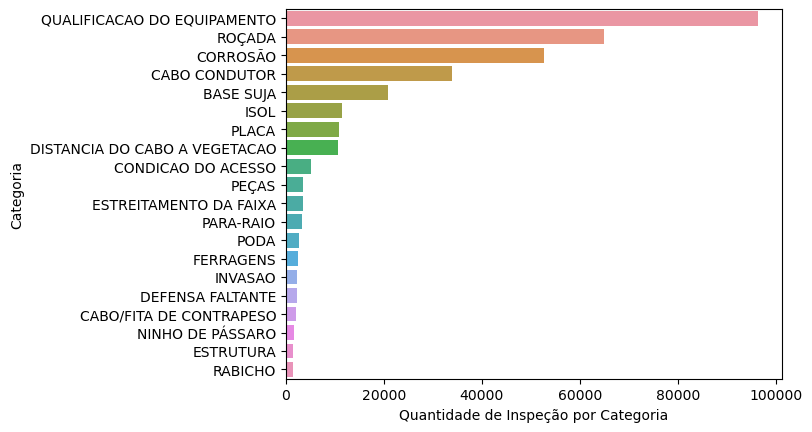

In [12]:
aux_data = df_docs['denominação_processed'].value_counts()[:20]

plt.title("")

sns.barplot(
    y=aux_data.index,
    x=aux_data.values, orient='h'
)

plt.xlabel("Quantidade de Inspeção por Categoria")
plt.ylabel("Categoria")
plt.show()

In [26]:
origin

Equipamento                        219658
Linha de Transmissão                LT994
Denominação                    Torre 119F
Dt.entr.serviço                       NaN
Classe                   L_TORRE_AUTOPORT
Código ABC                              B
Tensão                                440
Latitude                       -23.769441
Longitude                      -46.376121
Ano                                     5
Taxa                                  3.8
count_Denominação                      19
denominação_processed                ISOL
above_threshold                      True
Name: 69, dtype: object

In [45]:
aux_df_docs = df_docs[df_docs['denominação_processed'] != 'QUALIFICACAO DO EQUIPAMENTO']
aux_df_docs = aux_df_docs[aux_df_docs['denominação_processed'] != 'ISOL']


inspecoes_motivo = aux_df_docs.groupby('Equipamento', as_index = False)['denominação_processed'].agg(pd.Series.mode)
inspecoes = aux_df_docs.groupby('Equipamento', as_index = False)['denominação_processed'].count()
anos = aux_df_docs.groupby('Equipamento', as_index = False)['Ano'].nunique()

# df_cad.merge()
inspecoes = inspecoes.merge(anos, on='Equipamento')
inspecoes['Taxa'] = inspecoes["denominação_processed"]/inspecoes['Ano']

inspecoes['count_Denominação'] = inspecoes['denominação_processed']
del inspecoes['denominação_processed']

aux_cad = df_cad.merge(inspecoes, on='Equipamento')
aux_cad = aux_cad.merge(inspecoes_motivo, on='Equipamento')


aux_cad['above_threshold'] = aux_cad['Taxa'] > 4

fig = Figure(width=1200, height=1000)

df = aux_cad[~aux_cad['Latitude'].isna()]
df = df[df['above_threshold'] == True]

grupos = df.groupby('Linha de Transmissão')

colors = {
}

m = folium.Map(location=([-23.533773, -46.625290]))
folium.TileLayer('Cartodb Positron').add_to(m)

for nome_linha, grupo in list(grupos)[:]:
    grupo = grupo.reset_index(drop=True)


    for idx in range(0, len(grupo)):

        origin = grupo.loc[idx, :]

        if isinstance(origin['denominação_processed'], str):
            if origin['denominação_processed'] not in colors:
                colors[origin['denominação_processed']] =  f"#{random.randint(0, 0xFFFFFF):06x}"

            folium.CircleMarker([origin['Latitude'], origin['Longitude']],
                radius=3, color=colors[origin['denominação_processed']],
                fill_color=colors[origin['denominação_processed']],
                popup=origin['denominação_processed'], fill=True
            ).add_to(m)
        
        else:
            if origin['denominação_processed'][-1] not in colors:
                colors[origin['denominação_processed'][-1]] =  f"#{random.randint(0, 0xFFFFFF):06x}"

            folium.CircleMarker([origin['Latitude'], origin['Longitude']],
                radius=3, color=colors[origin['denominação_processed'][-1]],
                fill_color=colors[origin['denominação_processed'][-1]],
                popup=origin['denominação_processed'], fill=True
            ).add_to(m)

       

legends = [f'&nbsp; <i class="fa fa-circle" style="color:{colors[i]}"></i> {i} &nbsp; <br>' for i in sorted(colors)[:21]]

legend_html = '''
{% macro html(this, kwargs) %}
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 300px; height: 450px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white; opacity: 0.85;">
     &nbsp; <b>Legend</b> <br>'''+" ".join(legends)+'''     
</div>
{% endmacro %}
'''

legend = branca.element.MacroElement()
legend._template = branca.element.Template(legend_html)


fig.add_child(m)
fig.add_child(legend)


m

In [46]:
aux_df_docs = df_docs[df_docs['denominação_processed'] != 'QUALIFICACAO DO EQUIPAMENTO']
aux_df_docs = aux_df_docs[aux_df_docs['denominação_processed'] != 'ISOL']


inspecoes_motivo = aux_df_docs.groupby('Equipamento', as_index = False)['denominação_processed'].agg(pd.Series.mode)
inspecoes = aux_df_docs.groupby('Equipamento', as_index = False)['denominação_processed'].count()
anos = aux_df_docs.groupby('Equipamento', as_index = False)['Ano'].nunique()

# df_cad.merge()
inspecoes = inspecoes.merge(anos, on='Equipamento')
inspecoes['Taxa'] = inspecoes["denominação_processed"]/inspecoes['Ano']

inspecoes['count_Denominação'] = inspecoes['denominação_processed']
del inspecoes['denominação_processed']

aux_cad = df_cad.merge(inspecoes, on='Equipamento')
aux_cad = aux_cad.merge(inspecoes_motivo, on='Equipamento')


aux_cad['above_threshold'] = aux_cad['Taxa'] == 1

fig = Figure(width=1200, height=1000)

df = aux_cad[~aux_cad['Latitude'].isna()]
df = df[df['above_threshold'] == True]

grupos = df.groupby('Linha de Transmissão')



m = folium.Map(location=([-23.533773, -46.625290]))
folium.TileLayer('Cartodb Positron').add_to(m)

for nome_linha, grupo in list(grupos)[::2]:
    grupo = grupo.reset_index(drop=True)


    for idx in range(0, len(grupo)):

        origin = grupo.loc[idx, :]

        if isinstance(origin['denominação_processed'], str):
            if origin['denominação_processed'] not in colors:
                colors[origin['denominação_processed']] =  f"#{random.randint(0, 0xFFFFFF):06x}"

            folium.CircleMarker([origin['Latitude'], origin['Longitude']],
                radius=3, color=colors[origin['denominação_processed']],
                fill_color=colors[origin['denominação_processed']],
                popup=origin['denominação_processed'], fill=True
            ).add_to(m)
        
        else:
            if origin['denominação_processed'][-1] not in colors:
                colors[origin['denominação_processed'][-1]] =  f"#{random.randint(0, 0xFFFFFF):06x}"

            folium.CircleMarker([origin['Latitude'], origin['Longitude']],
                radius=3, color=colors[origin['denominação_processed'][-1]],
                fill_color=colors[origin['denominação_processed'][-1]],
                popup=origin['denominação_processed'], fill=True
            ).add_to(m)

       

legends = [f'&nbsp; <i class="fa fa-circle" style="color:{colors[i]}"></i> {i} &nbsp; <br>' for i in sorted(colors)[:21]]

legend_html = '''
{% macro html(this, kwargs) %}
<div style="position: fixed; 
     bottom: 50px; left: 50px; width: 300px; height: 450px; 
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white; opacity: 0.85;">
     &nbsp; <b>Legend</b> <br>'''+" ".join(legends)+'''     
</div>
{% endmacro %}
'''

legend = branca.element.MacroElement()
legend._template = branca.element.Template(legend_html)


fig.add_child(m)
fig.add_child(legend)


m

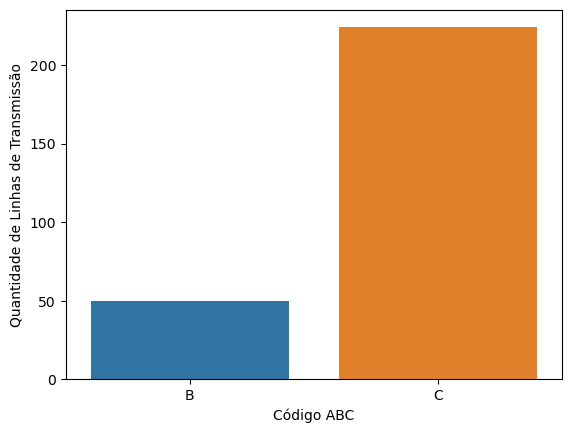

In [ ]:
aux_data = df_cad.groupby('Código ABC')['Linha de Transmissão'].nunique()

sns.barplot(
    x=aux_data.index,
    y=aux_data.values
)
plt.ylabel("Quantidade de Linhas de Transmissão")
plt.show()

Text(0, 0.5, 'Proporção')

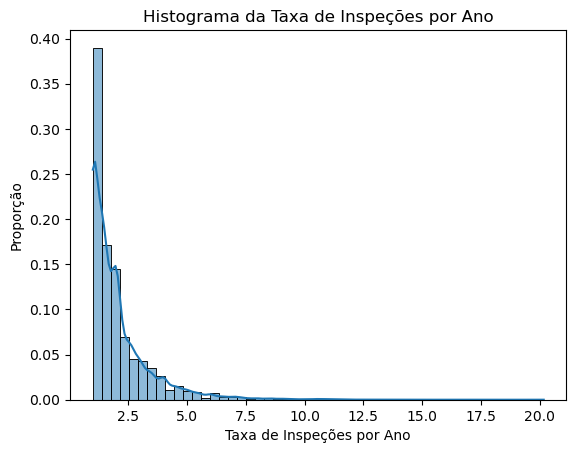

In [63]:
sns.histplot(
    x=inspecoes['Taxa'],
    stat="probability", common_norm=False,  bins=50, kde=True
)

plt.title("Histograma da Taxa de Inspeções por Ano")
plt.xlabel("Taxa de Inspeções por Ano")
plt.ylabel("Proporção")

Text(0, 0.5, 'Frequencia')

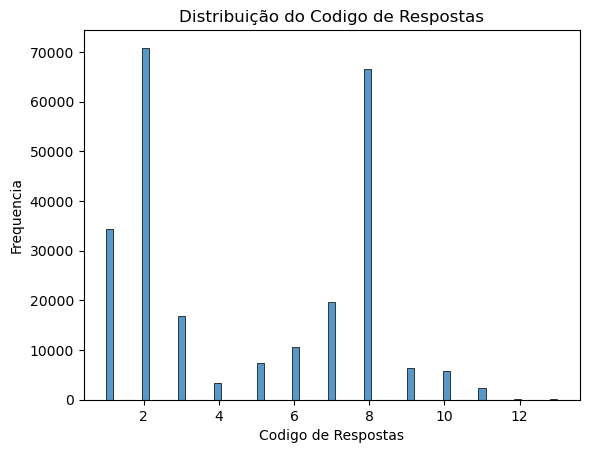

In [66]:
sns.histplot(
    x=df_docs['Cód.valorização']
)

plt.title("Distribuição do Codigo de Respostas")
plt.xlabel("Codigo de Respostas")
plt.ylabel("Frequencia")

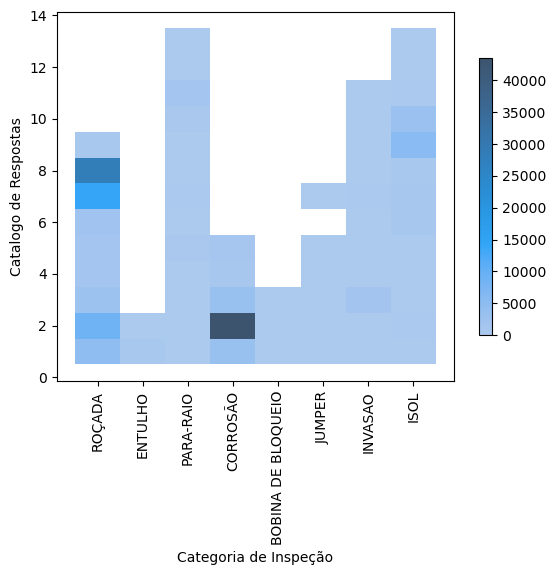

In [87]:
aux_df = df_docs[df_docs['denominação_processed'].isin(['ROÇADA', 'CORROSÃO', 'ENTULHO', 'ISOL', 'JUMPER', 'PARA-RAIO', 'INVASAO', 'BOBINA DE BLOQUEIO'])]

sns.histplot(
    x=aux_df['denominação_processed'],
    y=aux_df['Cód.valorização'], discrete=(True, True),
    cbar=True, cbar_kws=dict(shrink=.75),
)
plt.xticks(rotation=90)
plt.xlabel("Categoria de Inspeção")
plt.ylabel("Catalogo de Respostas")
plt.show()

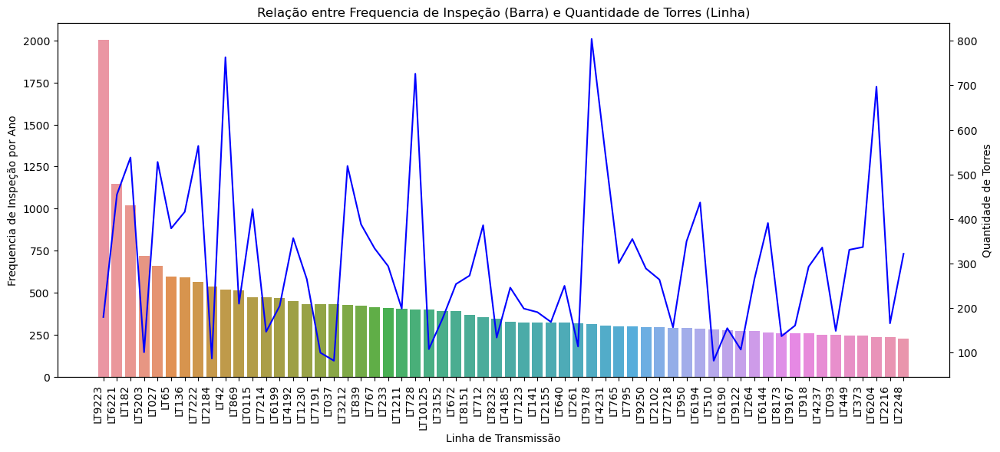

In [101]:

aux_data = (df_docs.groupby('Linha de Transmissão')['Denominação'].count()/df_docs.groupby('Linha de Transmissão')['Ano'].nunique()).sort_values(ascending=False)[:60]

aux_cad = df_cad[df_cad['Linha de Transmissão'].isin(aux_data.index)]
aux_cad = aux_cad.groupby('Linha de Transmissão')['Equipamento'].nunique()

plt.figure(figsize=(15, 6))

sns.barplot(
    x=aux_data.index,
    y=aux_data.values
)

plt.title("Relação entre Frequencia de Inspeção (Barra) e Quantidade de Torres (Linha)")

plt.ylabel("Frequencia de Inspeção por Ano")
plt.xticks(rotation=90, ha='right')

ax2 = plt.twinx()
sns.lineplot(x=aux_cad.index, y=aux_cad.values, color="b", ax=ax2, markers='x')
plt.ylabel("Quantidade de Torres")


plt.show()


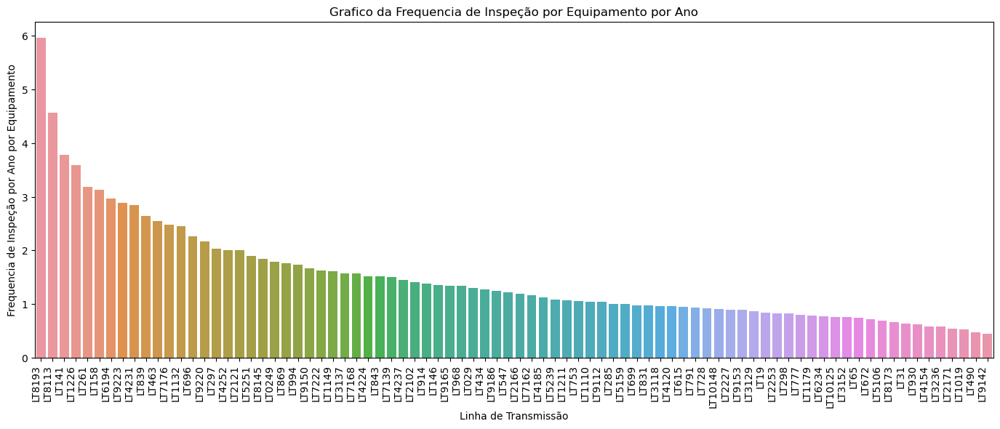

In [112]:

aux_data = (df_docs.groupby('Linha de Transmissão')['Denominação'].count()/df_docs.groupby('Linha de Transmissão')['Ano'].nunique()/df_docs.groupby('Linha de Transmissão')['Equipamento'].nunique()).sort_values(ascending=False)[::3]

plt.figure(figsize=(17, 6))

sns.barplot(
    x=aux_data.index,
    y=aux_data.values
)

plt.title("Grafico da Frequencia de Inspeção por Equipamento por Ano")

plt.ylabel("Frequencia de Inspeção por Ano por Equipamento")
plt.xticks(rotation=90, ha='right')


plt.show()
